In [1]:
import numpy as np
from IPython.display import display, Image
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from skimage.feature import daisy
from skimage.io import imshow
from PIL import Image
import torch
from torchvision.utils import make_grid
import torch.utils.data as data
import numpy as np
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os
import plotly
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split
from torch.utils.data.dataloader import DataLoader
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [2]:
data_dir = r"C:\Users\ethan\MachineLearningNotebooks\Weather-Conditions-Classification\data\Multi-class Weather Dataset"
filepaths = []
labels = []

folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

filepaths_array = np.array(filepaths)
labels_array = np.array(labels)

print("File Paths:")
print(filepaths_array)
print("Labels:")
print(labels_array)

File Paths:
['C:\\Users\\ethan\\MachineLearningNotebooks\\Weather-Conditions-Classification\\data\\Multi-class Weather Dataset\\Cloudy\\cloudy1.jpg'
 'C:\\Users\\ethan\\MachineLearningNotebooks\\Weather-Conditions-Classification\\data\\Multi-class Weather Dataset\\Cloudy\\cloudy10.jpg'
 'C:\\Users\\ethan\\MachineLearningNotebooks\\Weather-Conditions-Classification\\data\\Multi-class Weather Dataset\\Cloudy\\cloudy100.jpg'
 ...
 'C:\\Users\\ethan\\MachineLearningNotebooks\\Weather-Conditions-Classification\\data\\Multi-class Weather Dataset\\Sunrise\\sunrise97.jpg'
 'C:\\Users\\ethan\\MachineLearningNotebooks\\Weather-Conditions-Classification\\data\\Multi-class Weather Dataset\\Sunrise\\sunrise98.jpg'
 'C:\\Users\\ethan\\MachineLearningNotebooks\\Weather-Conditions-Classification\\data\\Multi-class Weather Dataset\\Sunrise\\sunrise99.jpg']
Labels:
['Cloudy' 'Cloudy' 'Cloudy' ... 'Sunrise' 'Sunrise' 'Sunrise']


In [3]:
resized_images_PCA = []
resized_images_print = []
nn_array = []

def show_image(img):
    print("File Path:", filepaths_array[i])
    plt.imshow(img, cmap='gray')
    plt.title(f"Label: {labels_array[i]}")
    plt.axis('off')
    plt.show()

def load_and_process_image(file_path):
    size = (200,200)
    image = Image.open(file_path)
    resized_image = image.resize(size)
    return resized_image

def grayscale_image(image):
    gray_image = image.convert("L")
    return gray_image

for i in range(len(filepaths_array)):
    image = load_and_process_image(filepaths_array[i])
    grayscaled_image = grayscale_image(image)
    resized_image_array_PCA = np.array(grayscaled_image).flatten()
    resized_image_array_PCA = resized_image_array_PCA.astype(np.float32)/255.0
    resized_images_PCA.append(resized_image_array_PCA)

    resized_image_array_print = np.array(grayscaled_image)
    resized_images_print.append(resized_image_array_print)
    image = np.array(image)
    image = image/255.0
    nn_array.append(image)

resized_images_array_PCA = np.array(resized_images_PCA)
resized_images_array_print = np.array(resized_images_print)

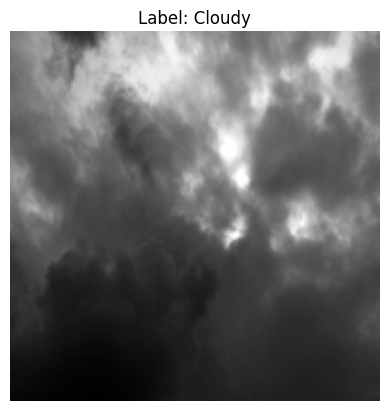

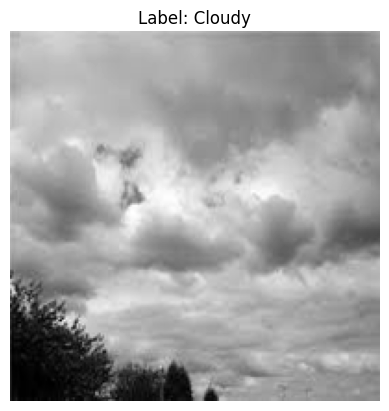

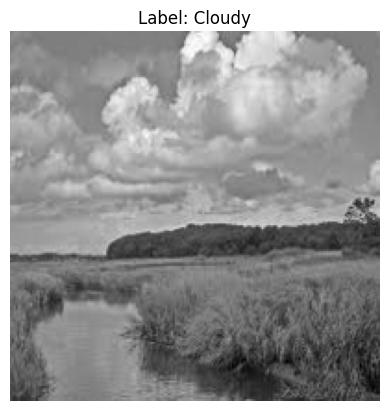

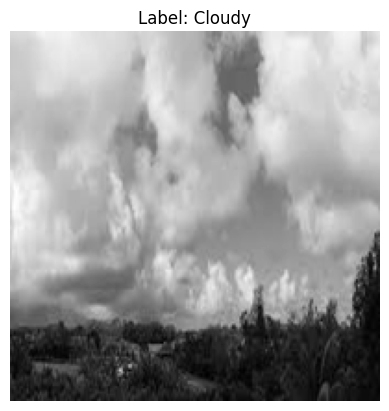

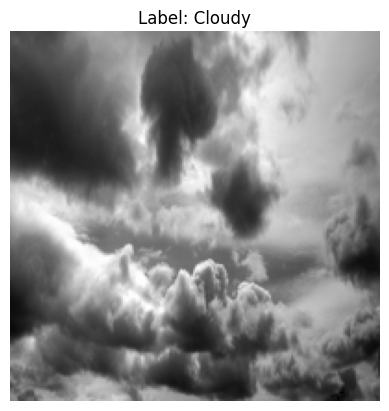

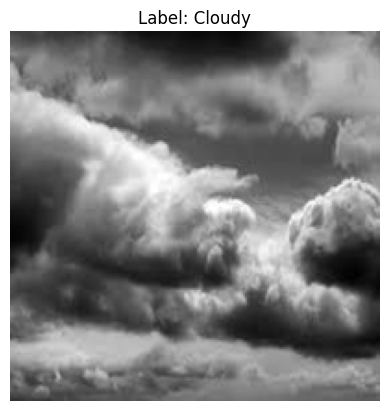

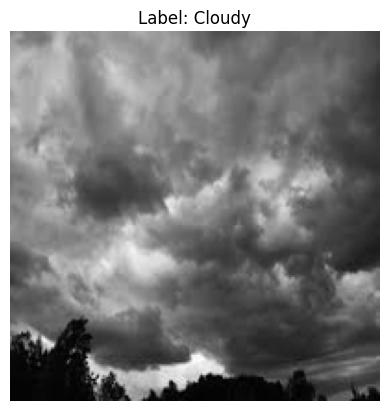

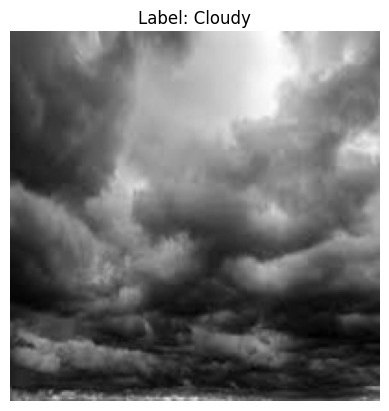

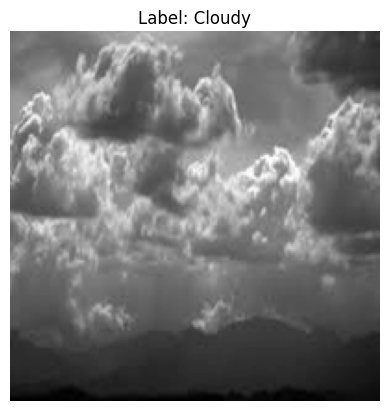

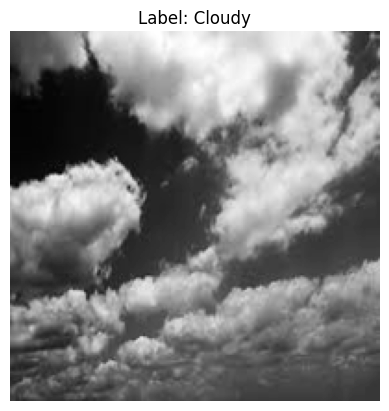

In [4]:
for i in range(10):
    img = resized_images_print[i]
    plt.imshow(img, cmap='gray')
    plt.title(f"Label: {labels_array[i]}")
    plt.axis('off')
    plt.show()

In [5]:
X = resized_images_array_PCA
print(resized_images_array_PCA.shape)
n_samples, h, w = resized_images_array_print.shape

(1125, 40000)


In [6]:
# lets do some PCA of the features and go from 1850 features to 20 features
from sklearn.decomposition import PCA

n_components = 300
print ("Extracting the top %d eigenfaces from %d faces" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenweather = pca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenfaces from 1125 faces
CPU times: total: 17.2 s
Wall time: 6 s


In [7]:
def plot_explained_variance(pca):
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
   



In [8]:
pca = PCA(n_components=300)
X_pca = pca.fit(X)
plot_explained_variance(pca)

In [9]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

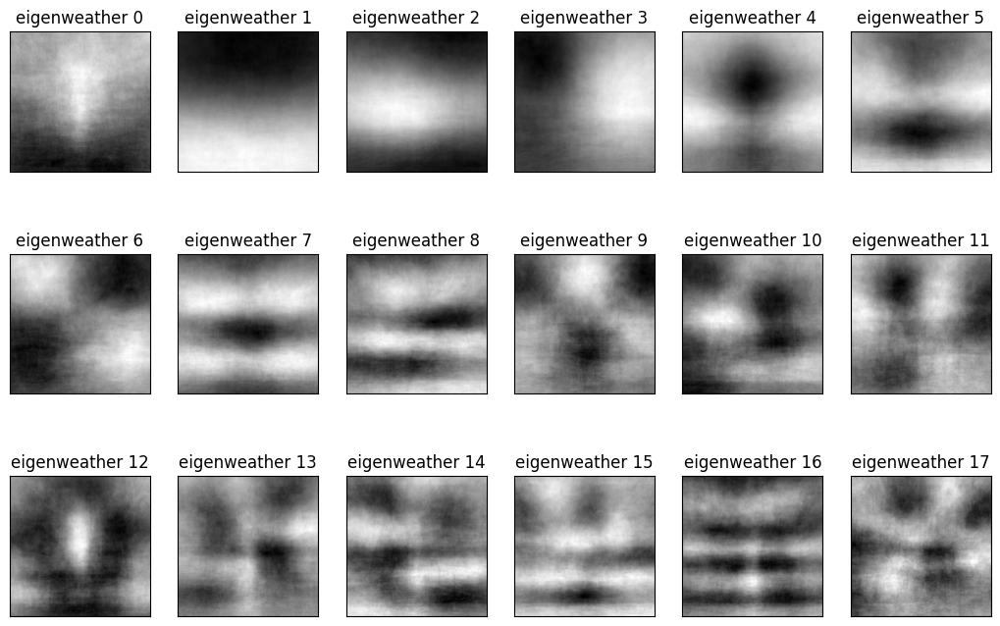

In [10]:
eigenweather_titles = ["eigenweather %d" % i for i in range(eigenweather.shape[0])]
plot_gallery(eigenweather, eigenweather_titles, h, w)

In [11]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 1    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

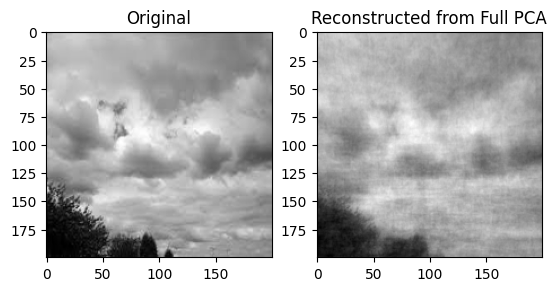

In [12]:
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)

### Randomized PCA

In [13]:
# lets do some PCA of the features and go from 1850 features to 300 features

n_components = 300
print ("Extracting the top %d eigenweathers from %d weather images" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(X.copy())
eigenweathers = rpca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenweathers from 1125 weather images
CPU times: total: 15.9 s
Wall time: 5.16 s


In [14]:
plot_explained_variance(rpca)

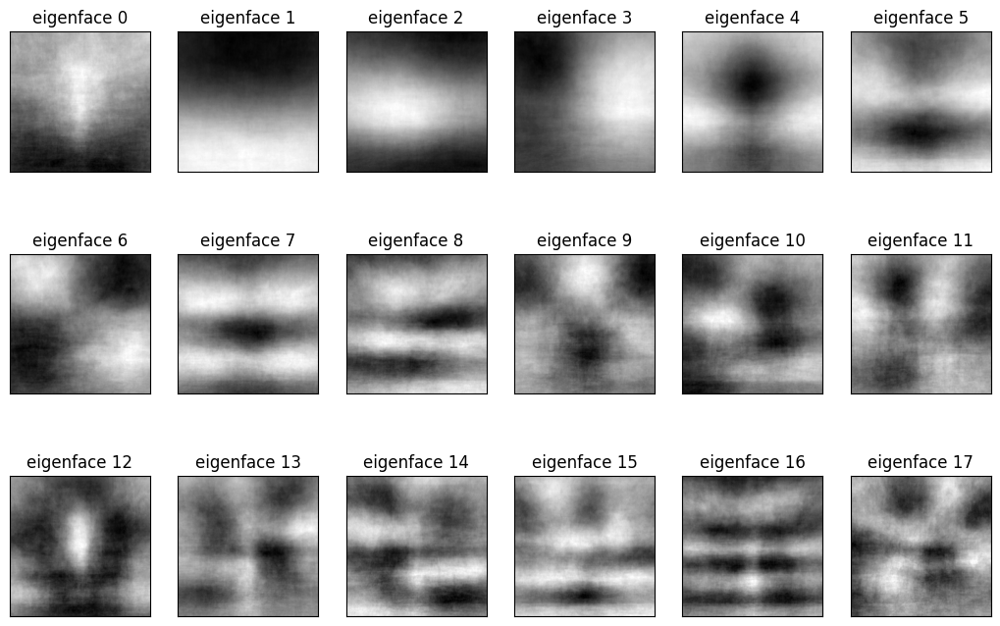

In [15]:
eigenweather_titles = ["eigenface %d" % i for i in range(eigenweathers.shape[0])]
plot_gallery(eigenweathers, eigenweather_titles, h, w)

In [16]:
import warnings
from ipywidgets import widgets  # make this interactive!
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)



def plt_reconstruct(idx_to_reconstruct):
    # this code is for reference only, it does not qualify as a neaarest neighbor search
    #  for your lab project. 
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    x_flat = X[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(x_flat.copy()))    
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(x_flat.copy()))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,3,1) # original
    plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(labels_array[idx_to_reconstruct]+f", {x_flat.shape[1]} elements")
    plt.grid(False)
    
    plt.subplot(1,3,2) # pca
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {n_components} elements")
    plt.grid(False)
    
    plt.subplot(1,3,3) # randomized pca
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {n_components} elements")
    plt.grid(False)
    
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

interactive(children=(IntSlider(value=562, description='idx_to_reconstruct', max=1124), Output()), _dom_classe…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

### Image Feature: DAISY Bag of Features Model

In [17]:
# now let's understand how to use it
features = daisy(img, step=20, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(8, 8, 68)
4352


In [18]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=20, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: total: 0 ns
Wall time: 25.7 ms


(4352,)

In [19]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: total: 11.9 s
Wall time: 30.1 s
(1125, 4352)


In [20]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: total: 78.1 ms
Wall time: 165 ms


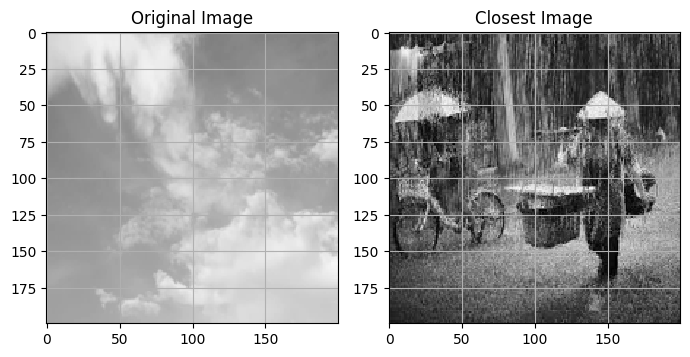

In [21]:
import copy
# find closest image to current image
idx1 = 30
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

Daisy is completely worthless for weather analysis because orientation isn't relevant. (Expand on this thought).

### K-Nearest Neighbors Classification

In [22]:
print(resized_images_array_PCA.shape)

(1125, 40000)


In [23]:
# Sample data (replace with your own data)
X = resized_images_array_PCA
y = labels_array

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a K-Nearest Neighbors classifier
knn_classifier = KNeighborsClassifier(n_neighbors=4)  # You can adjust 'n_neighbors' as needed

# Fit the classifier to the training data
knn_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6311111111111111


### Using a Convulutional Neural Network for better classification

In [24]:
if torch.cuda.is_available():
    print("GPU is available.")
else:
    print("GPU is not available. Training on CPU.")

torch.cuda.empty_cache()   
torch.cuda.memory_allocated() 

GPU is available.


0

In [25]:
#train and test data directory
data_dir = "./data/Multi-class Weather Dataset"

#load the train and test data
dataset = ImageFolder(data_dir,transform = transforms.Compose([
    transforms.Resize((150,150)),transforms.ToTensor()
]))

# Define the total size of your dataset
total_size = len(dataset)

# Define the sizes for the training and testing subsets
train_size = int(0.8 * total_size)  # 80% of the data for training
test_size = total_size - train_size  # Remaining 20% for testing

# Use random_split to split the dataset into training and testing subsets
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

In [26]:
img, label = dataset[0]
print(img.shape,label)
print("Follwing classes are there : \n",dataset.classes)

torch.Size([3, 150, 150]) 0
Follwing classes are there : 
 ['Cloudy', 'Rain', 'Shine', 'Sunrise']


In [27]:
batch_size = 16
val_size = int(.2*len(train_dataset))
train_size = len(train_dataset) - val_size 
train_data,val_data = random_split(train_dataset,[train_size,val_size])
print(f"Length of Train Data : {len(train_data)}")
print(f"Length of Validation Data : {len(val_data)}")

#output
#Length of Train Data : 12034
#Length of Validation Data : 2000

#load the train and validation into batches.
train_dl = DataLoader(train_data, batch_size, shuffle = True, num_workers = 4, pin_memory = True)
val_dl = DataLoader(val_data, batch_size*2, num_workers = 4, pin_memory = True)

Length of Train Data : 720
Length of Validation Data : 180


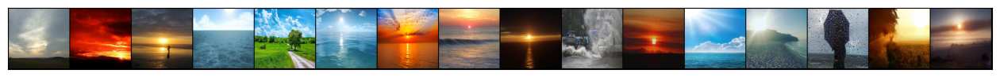

In [28]:
def show_batch(dl):
    """Plot images grid of single batch"""
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (16,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=16).permute(1,2,0))
        break
        
show_batch(train_dl)

In [29]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))
        
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [30]:
class NaturalSceneClassification(ImageClassificationBase):
    
    def __init__(self):
        
        super().__init__()
        self.network = nn.Sequential(
            
            nn.Conv2d(3, 32, kernel_size = 3, padding = 1),
            nn.ReLU(),
            nn.Conv2d(32,64, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
        
            nn.Conv2d(64, 128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(128 ,128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),

            nn.Conv2d(128, 256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(256,256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            
            nn.Flatten(),
            nn.Linear(82944,1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512,6)
        )
    
    def forward(self, xb):
        return self.network(xb)

In [31]:
model = NaturalSceneClassification()
model
torch.cuda.empty_cache()
torch.cuda.memory_allocated()

0

In [32]:
for images, labels in train_dl:
    print('images.shape:', images.shape)
    out = model(images)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([16, 3, 150, 150])
out.shape: torch.Size([16, 6])
out[0]: tensor([ 0.0258, -0.0374, -0.0435, -0.0080, -0.0301,  0.0116],
       grad_fn=<SelectBackward0>)


In [33]:
def get_default_device():
    """ Set Device to GPU or CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    

def to_device(data, device):
    "Move data to the device"
    if isinstance(data,(list,tuple)):
        return [to_device(x,device) for x in data]
    return data.to(device,non_blocking = True)

class DeviceDataLoader():
    """ Wrap a dataloader to move data to a device """
    
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
    
    def __iter__(self):
        """ Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b,self.device)
            
    def __len__(self):
        """ Number of batches """
        return len(self.dl)

In [34]:
device = get_default_device()
device

device(type='cuda')

In [35]:
# load the into GPU
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
to_device(model, device)

NaturalSceneClassification(
  (network): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=82944, out_features=1024, bias=True)
    (17): ReLU()
    (18): Li

In [36]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func = torch.optim.SGD):
    
    history = []
    optimizer = opt_func(model.parameters(),lr)
    for epoch in range(epochs):
        
        model.train()
        train_losses = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    
    return history

In [37]:
#load the model to the device
model = to_device(NaturalSceneClassification(),device)

In [38]:
#initial evaluation of the model
evaluate(model,val_dl)

{'val_loss': 1.7882369756698608, 'val_acc': 0.3020833432674408}

In [39]:
#set the no. of epochs, optimizer funtion and learning rate
num_epochs = 30
opt_func = torch.optim.Adam
lr = 0.001
torch.cuda.memory_allocated()

701239296

In [40]:
#fitting the model on training data and record the result after each epoch
history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)

Epoch [0], train_loss: 1.1730, val_loss: 1.0596, val_acc: 0.5531
Epoch [1], train_loss: 0.8391, val_loss: 0.9653, val_acc: 0.5760
Epoch [2], train_loss: 0.7813, val_loss: 0.9535, val_acc: 0.6219
Epoch [3], train_loss: 0.6440, val_loss: 0.8632, val_acc: 0.7104
Epoch [4], train_loss: 0.6003, val_loss: 1.1393, val_acc: 0.7573
Epoch [5], train_loss: 0.5317, val_loss: 0.7100, val_acc: 0.7552
Epoch [6], train_loss: 0.4765, val_loss: 0.5337, val_acc: 0.8552
Epoch [7], train_loss: 0.4610, val_loss: 0.6114, val_acc: 0.8083
Epoch [8], train_loss: 0.5044, val_loss: 0.5436, val_acc: 0.8156
Epoch [9], train_loss: 0.5196, val_loss: 0.7635, val_acc: 0.8229
Epoch [10], train_loss: 0.4302, val_loss: 0.8191, val_acc: 0.8271
Epoch [11], train_loss: 0.3595, val_loss: 0.5846, val_acc: 0.8240
Epoch [12], train_loss: 0.3330, val_loss: 0.5986, val_acc: 0.7979
Epoch [13], train_loss: 0.2972, val_loss: 0.5455, val_acc: 0.8115
Epoch [14], train_loss: 0.2878, val_loss: 0.8212, val_acc: 0.7823
Epoch [15], train_lo

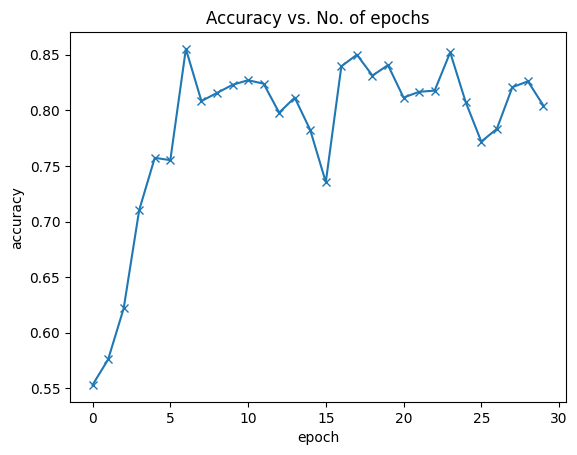

In [41]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');
    

plot_accuracies(history)

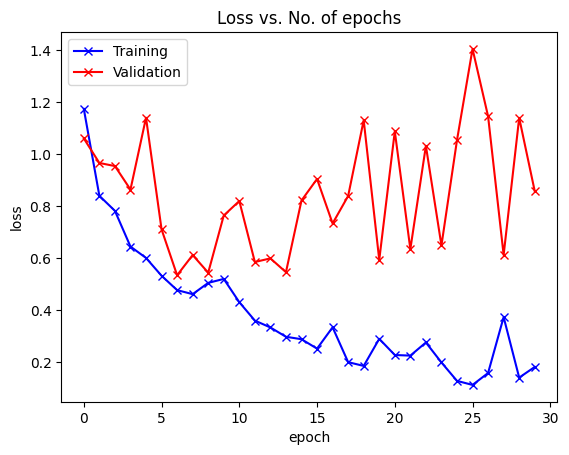

In [42]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)